# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
### Imports required

In [1]:
# fix for pyqt5
import sys
from PyQt5.QtWidgets import QApplication, QMainWindow, QMenu, QVBoxLayout, QSizePolicy, QMessageBox, QWidget, QPushButton
from PyQt5.QtGui import QIcon
#******************************************************************
#import matplotlib
#matplotlib.use("Qt5Agg")
#******************************************************************
from PyQt5 import QtCore 
from matplotlib.backends.backend_qt5agg import FigureCanvasQTAgg as FigureCanvas
from matplotlib.figure import Figure
import matplotlib.pyplot as plt
%matplotlib inline

import math
import numpy as np
import cv2
from cv2 import erode
from cv2 import dilate
import glob

import pickle

## First, we compute the camera calibration using chessboard images

In [ ]:
# checkerboard Dimensions
cbrow = 6
cbcol = 9

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((cbcol*cbrow,3), np.float32)
objp[:,:2] = np.mgrid[0:cbcol, 0:cbrow].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (cbcol,cbrow), None)

    # If found, add object points, image points
    if ret == True:
        print("Pattern Found")
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (cbcol,cbrow), corners, ret)
        write_name = 'output_images/corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)
        cv2.imshow('Corners Found', img)
        cv2.waitKey(500)
    else:
        print("Pattern NOT Found")

cv2.destroyAllWindows()

## Save the camera calibration matrix and store in file for later use

In [ ]:
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = img.shape[0:2]
# Get camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
print("mtx:")
print(mtx)
print("dist:")
print(dist)
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
with open("camera_cal/camera_cal.p", "wb" ) as f:
    pickle.dump(ret, f)
    pickle.dump(mtx, f)
    pickle.dump(dist, f)
    pickle.dump(rvecs, f)
    pickle.dump(tvecs, f)

print("Pickled File: ",f)

## If we have already stored the camera calibration matrix, we can read it in from file

In [2]:
with open("camera_cal/camera_cal.p", "rb" ) as f:
    ret = pickle.load(f)
    mtx = pickle.load(f)
    dist = pickle.load(f)
    rvecs = pickle.load(f)
    tvecs = pickle.load(f)

print("Camera Calibration Parameters")
print("mtx:")
print(mtx)
print("dist:")
print(dist)

Camera Calibration Parameters
mtx:
[[  1.15396100e+03   0.00000000e+00   6.69706492e+02]
 [  0.00000000e+00   1.14802503e+03   3.85655582e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
dist:
[[ -2.41018767e-01  -5.30665431e-02  -1.15811319e-03  -1.28284935e-04
    2.67026162e-02]]


## Method to remove distortion from raw images

In [86]:
def remove_distortion(img, cameraMatrix=mtx, distCoeffs=dist):
    return cv2.undistort(img, cameraMatrix, distCoeffs, None, cameraMatrix)

### Test undistort

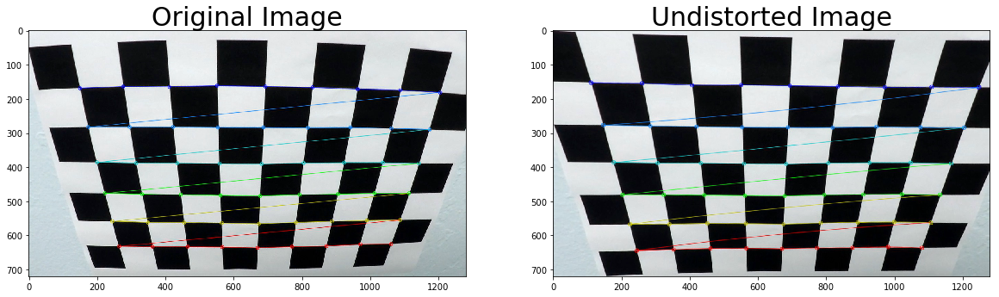

In [87]:
img = cv2.imread('output_images/corners_found11.jpg')
dst = remove_distortion(img)
cv2.imwrite('output_images/output_undist.jpg',dst)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

### Test undistort on image of lanes

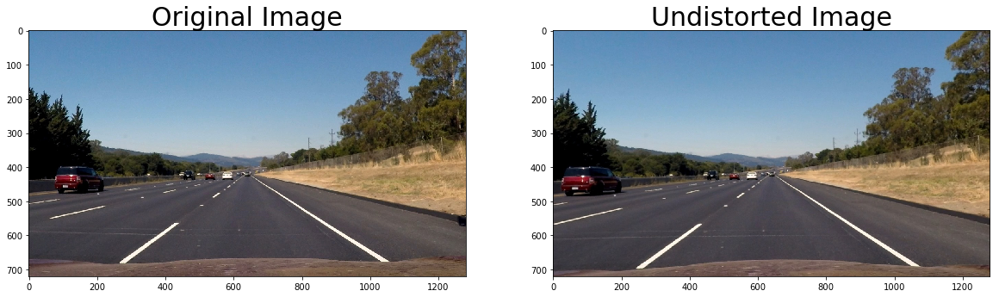

In [88]:
img = cv2.imread('test_images/straight_lines2.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = remove_distortion(img)

cv2.imwrite('output_images/straight_lines2_undist.jpg',dst)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Image Processing

In [4]:
# When apply colour mask, lets only weight the areas we suspect to see the lanes
X_COL_OFFSET = 60
Y_COL_OFFSET = 90

def region_of_interest(img, x_offset, y_offset):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    
    # First define four points to form a polygon    
    imshape = img.shape
    vertices = np.array([[(0,imshape[0]),
                          (imshape[1]/2-x_offset, imshape[0]/2+y_offset),
                          (imshape[1]/2+x_offset, imshape[0]/2+y_offset),
                          (imshape[1],imshape[0])]],
                            dtype=np.int32)
    
    #define a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel colour to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_colour = (255,) * channel_count
    else:
        ignore_mask_colour = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill colour    
    cv2.fillPoly(mask, vertices, ignore_mask_colour)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def gaussian_blur(img, kernel_size=5):
    """Applies a Gaussian Noise kernel"""
    # Default size of 5
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)


# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    if len(img.shape) == 3: 
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    if len(img.shape) == 3: 
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    if len(img.shape) > 2: 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def binary_threshold(img, thresh=(0,255)):
    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
    #binary = gaussian_blur(binary, kernel_size=blur_kernal_size)
    return binary

#def dir_pipe(img, dir_kernel=32, dir_thresh=(0.8,1.1), :
#    dir_binary = dir_threshold(img, sobel_kernel=31, thresh=(0.80, 1.1))
#    dst_thresh = (0.6, 1)
#    dst_binary = np.zeros_like(dst)
#    dst_binary[(dst > dst_thresh[0]) & (dst <= dst_thresh[1])] = 1
#    return region_of_interest(dst_binary,  X_COL_OFFSET, Y_COL_OFFSET)

def preprocess(img, s_threshold=(205,255), r_threshold=(205,255), l_threshold=(210,255), b_threshold=(148,255), mask=True):
    #img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Lab
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel = lab[:,:,0]
    b_channel = lab[:,:,2]
    l_thresh = binary_threshold(l_channel, thresh=l_threshold)
    b_thresh = binary_threshold(b_channel, thresh=b_threshold)
    
    #HLS
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    r_channel = img[:,:,0]
    s_thresh = binary_threshold(s_channel, thresh=s_threshold)
    r_thresh = binary_threshold(r_channel, thresh=r_threshold)
    
    # Comine all
    combined_binary = np.zeros_like(l_thresh)
    combined_binary[ (l_thresh == 1) | (b_thresh == 1) | (s_thresh == 1) | (r_thresh == 1) ] = 1
    
    if mask == True:
        combined_binary = region_of_interest(combined_binary,  X_COL_OFFSET, Y_COL_OFFSET)
        
    return  combined_binary
    

## Lets play around with Gray Threshold

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


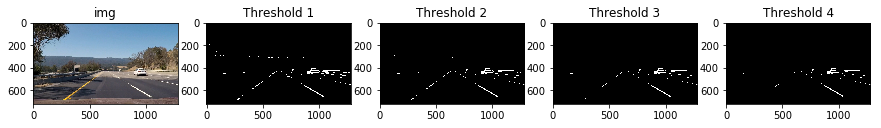

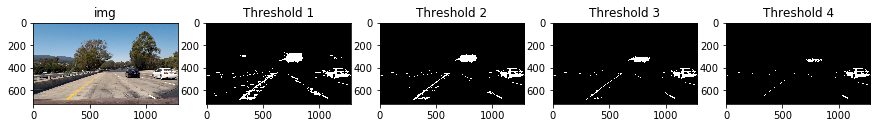

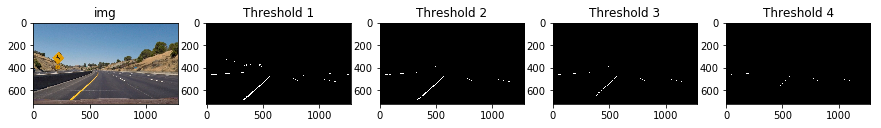

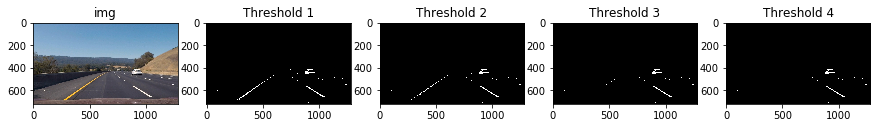

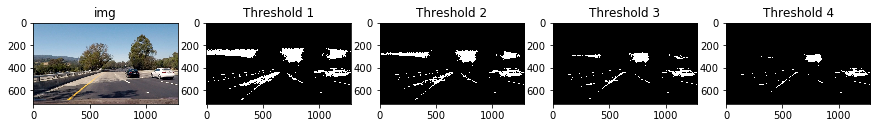

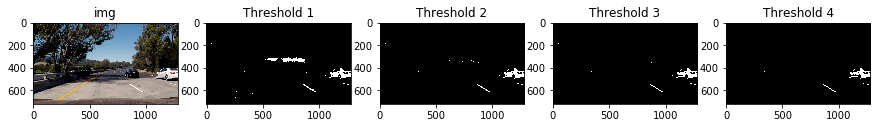

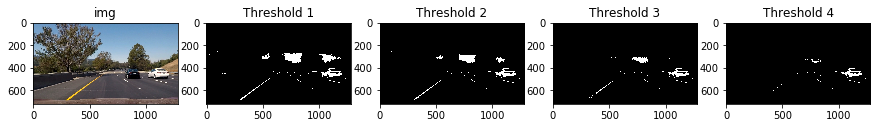

In [62]:


# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    gray_thresh1 = binary_threshold(gray, thresh=(190,255))
    gray_thresh2 = binary_threshold(gray, thresh=(195,255))
    gray_thresh3 = binary_threshold(gray, thresh=(200,255)) # Best Result
    gray_thresh4 = binary_threshold(gray, thresh=(205,255))
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(gray_thresh1, cmap='gray')
    ax2.set_title('Threshold 1')
    ax3.imshow(gray_thresh2, cmap='gray')
    ax3.set_title('Threshold 2')
    ax4.imshow(gray_thresh3, cmap='gray')
    ax4.set_title('Threshold 3')
    ax5.imshow(gray_thresh4, cmap='gray')
    ax5.set_title('Threshold 4')
   

## Lets play around with S Thresholds

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


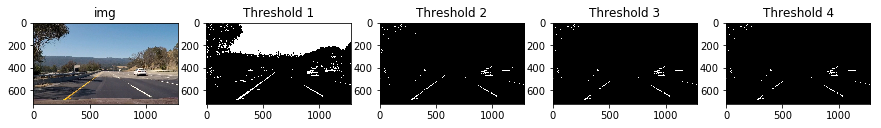

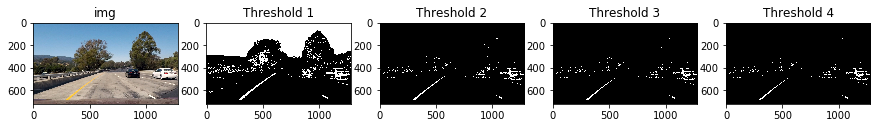

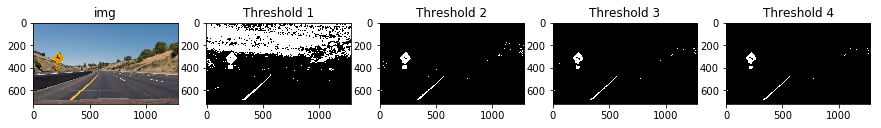

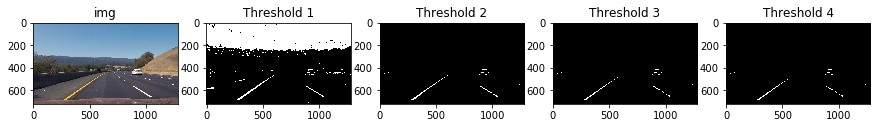

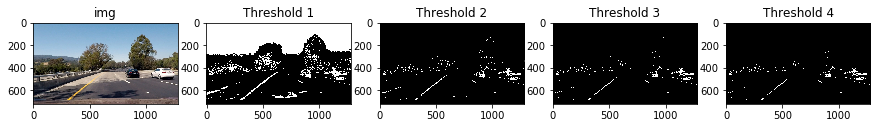

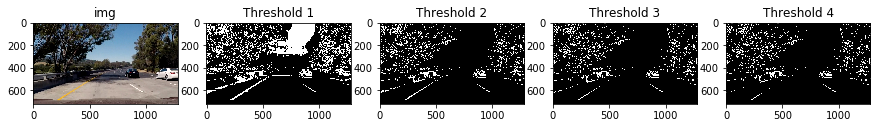

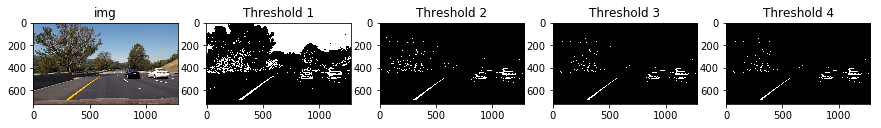

In [63]:
# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    
    s_thresh1 = binary_threshold(s_channel, thresh=(100,255))
    s_thresh2 = binary_threshold(s_channel, thresh=(170,255))
    s_thresh3 = binary_threshold(s_channel, thresh=(200,255)) # Best result
    s_thresh4 = binary_threshold(s_channel, thresh=(210,255))
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(s_thresh1, cmap='gray')
    ax2.set_title('Threshold 1')
    ax3.imshow(s_thresh2, cmap='gray')
    ax3.set_title('Threshold 2')
    ax4.imshow(s_thresh3, cmap='gray')
    ax4.set_title('Threshold 3')
    ax5.imshow(s_thresh4, cmap='gray')
    ax5.set_title('Threshold 4')
   

## Lets play around with R Threshold

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


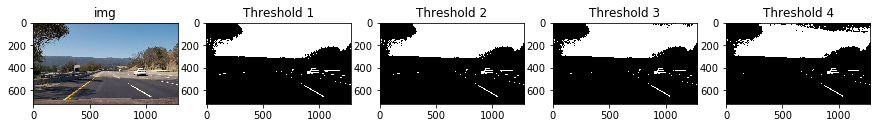

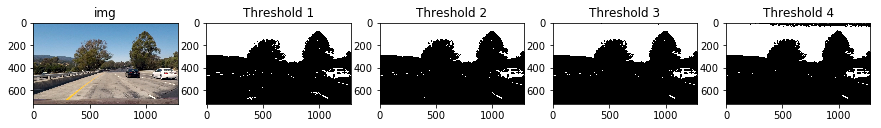

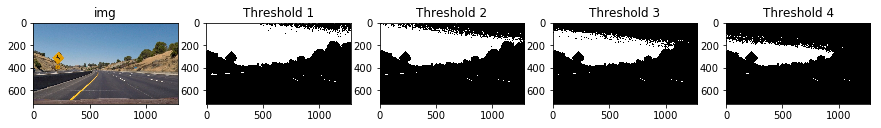

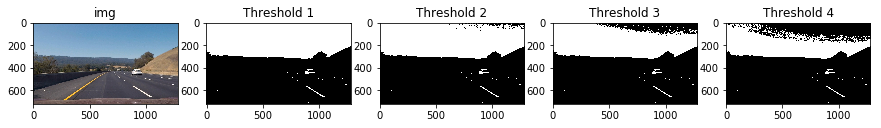

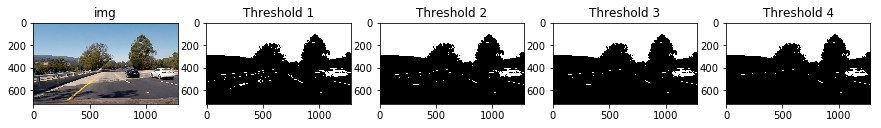

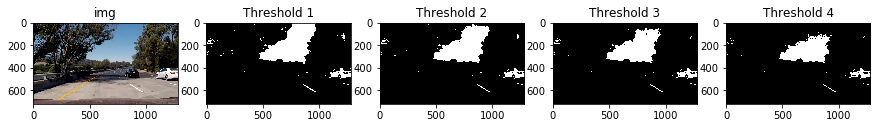

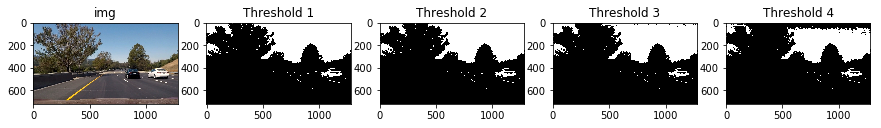

In [64]:
# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    
    r_channel = img[:,:,0]
    
    r_thresh1 = binary_threshold(r_channel, thresh=(180,255))
    r_thresh2 = binary_threshold(r_channel, thresh=(185,255)) # Best result
    r_thresh3 = binary_threshold(r_channel, thresh=(190,255))
    r_thresh4 = binary_threshold(r_channel, thresh=(195,255))
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(r_thresh1, cmap='gray')
    ax2.set_title('Threshold 1')
    ax3.imshow(r_thresh2, cmap='gray')
    ax3.set_title('Threshold 2')
    ax4.imshow(r_thresh3, cmap='gray')
    ax4.set_title('Threshold 3')
    ax5.imshow(r_thresh4, cmap='gray')
    ax5.set_title('Threshold 4')
   

## Lets play around with L Threshold

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


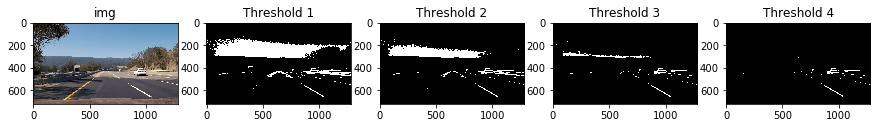

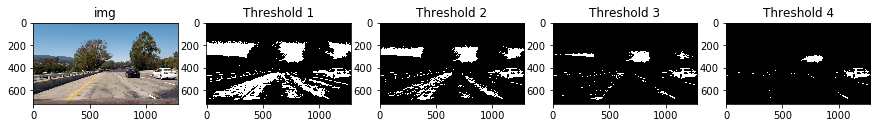

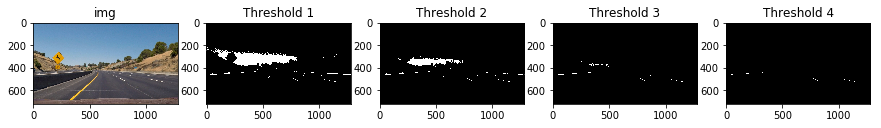

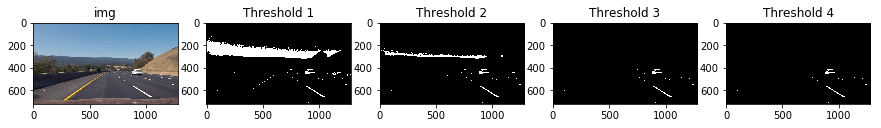

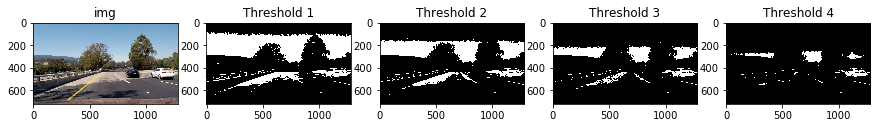

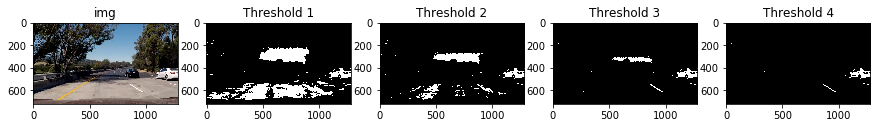

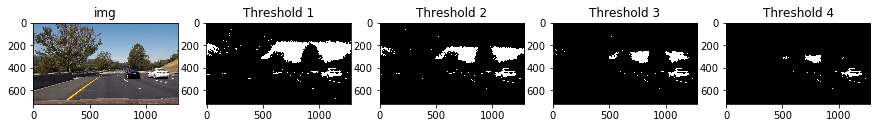

In [65]:
# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    
    l_thresh1 = binary_threshold(l_channel, thresh=(170,255))
    l_thresh2 = binary_threshold(l_channel, thresh=(180,255))
    l_thresh3 = binary_threshold(l_channel, thresh=(190,255))
    l_thresh4 = binary_threshold(l_channel, thresh=(200,255))
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(l_thresh1, cmap='gray')
    ax2.set_title('Threshold 1')
    ax3.imshow(l_thresh2, cmap='gray')
    ax3.set_title('Threshold 2')
    ax4.imshow(l_thresh3, cmap='gray')
    ax4.set_title('Threshold 3')
    ax5.imshow(l_thresh4, cmap='gray')
    ax5.set_title('Threshold 4')
   

## Lets play around with the LAB space

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


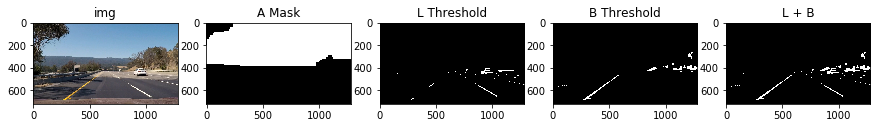

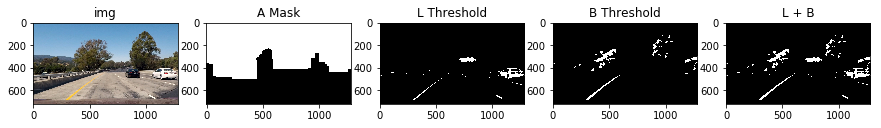

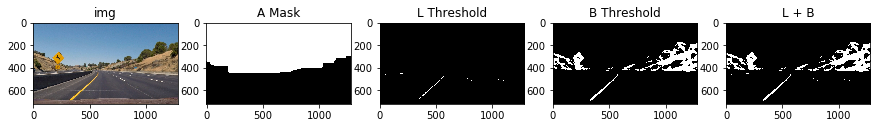

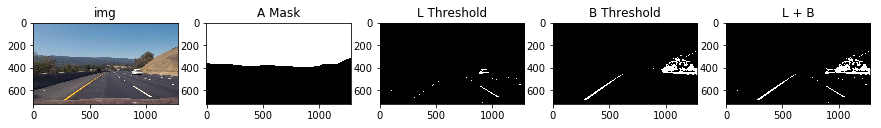

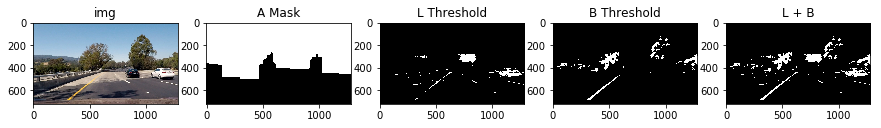

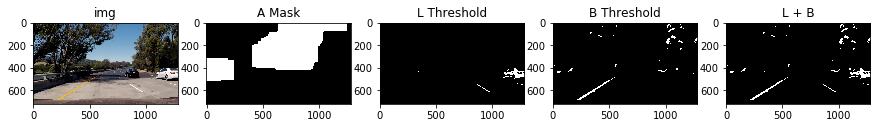

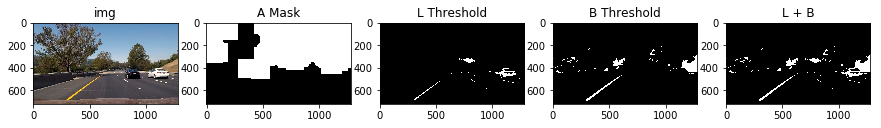

In [66]:
from cv2 import bitwise_or
from cv2 import bitwise_and
from cv2 import bitwise_xor
from cv2 import bitwise_not

# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    l_channel = lab[:,:,0]
    a_channel = lab[:,:,1]
    b_channel = lab[:,:,2]
    
    a_thresh = binary_threshold(a_channel, thresh=(126,129))
    ret, a_inv = cv2.threshold(a_channel,126,250,cv2.THRESH_BINARY_INV)
    kernel = np.ones((5,5),np.uint8)
    a_inv = erode(a_inv,kernel,iterations = 7)
    a_inv = dilate(a_inv,kernel,iterations = 40)
    
    l_thresh = binary_threshold(l_channel, thresh=(210,255))
    b_thresh = binary_threshold(b_channel, thresh=(148,255))

    combined_binary = np.zeros_like(l_thresh)
    combined_binary[ (l_thresh == 1) | (b_thresh == 1) ] = 1
    

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(a_inv, cmap='gray')
    ax2.set_title('A Mask')
    ax3.imshow(l_thresh, cmap='gray')
    ax3.set_title('L Threshold')
    ax4.imshow(b_thresh, cmap='gray')
    ax4.set_title('B Threshold')
    ax5.imshow(combined_binary, cmap='gray')
    ax5.set_title('L + B')


To stack vertically (img1 over img2):

vis = np.concatenate((img1, img2), axis=0)
To stack horizontally (img1 to the left of img2):

vis = np.concatenate((img1, img2), axis=1)

## Lets play around with mag threshold

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


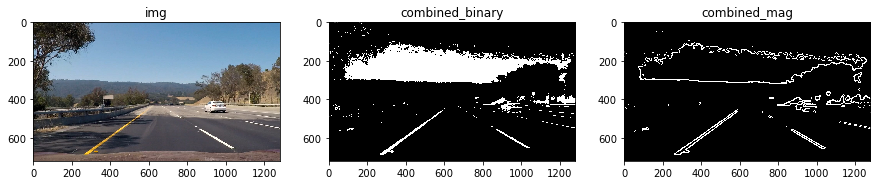

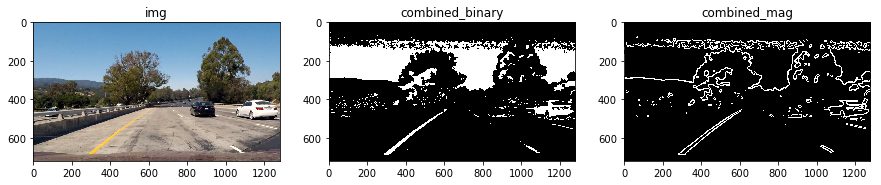

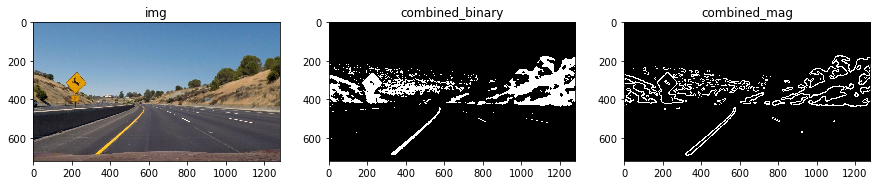

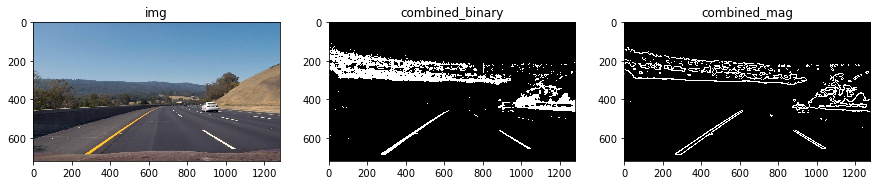

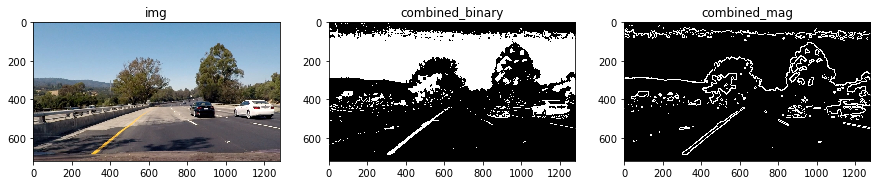

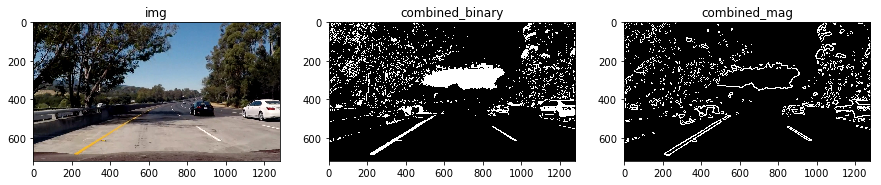

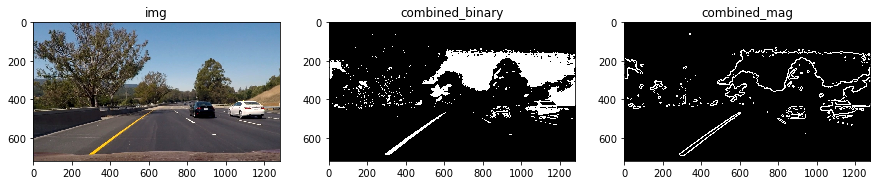

In [67]:
# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    
    # Lab
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel = lab[:,:,0]
    b_channel = lab[:,:,2]
    l_thresh = binary_threshold(l_channel, thresh=(210,255))
    b_thresh = binary_threshold(b_channel, thresh=(148,255))
    
    #HLS
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    r_channel = img[:,:,0]
    s_threshold = binary_threshold(s_channel, thresh=(205,255))
    r_threshold = binary_threshold(r_channel, thresh=(205,255))
    
    # Comine all
    combined_binary = np.zeros_like(l_thresh)
    combined_binary[ (l_thresh == 1) | (b_thresh == 1) | (s_threshold == 1) | (r_threshold == 1) ] = 1
    
    combined_mag = mag_thresh(combined_binary, sobel_kernel=27, thresh=(120, 255))
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(combined_binary, cmap='gray')
    ax2.set_title('combined_binary')
    ax3.imshow(combined_mag, cmap='gray')
    ax3.set_title('combined_mag')

## Lets play around with X-Direction Threshold

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


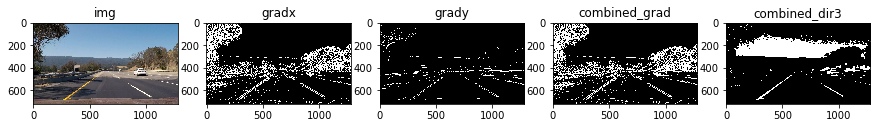

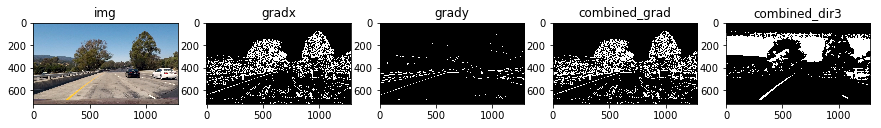

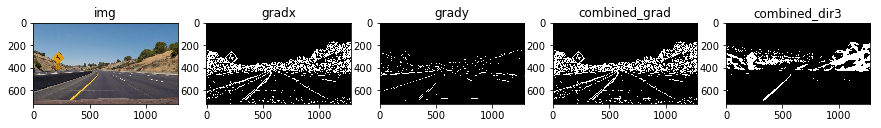

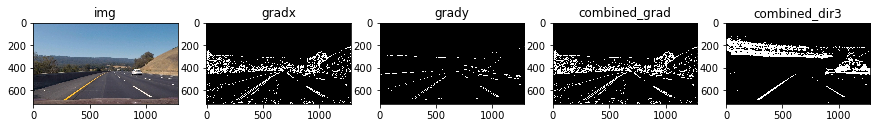

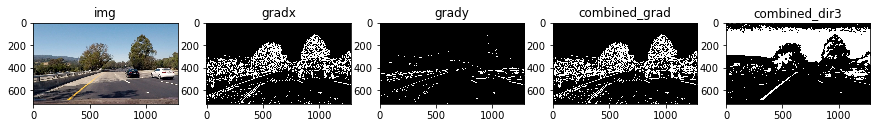

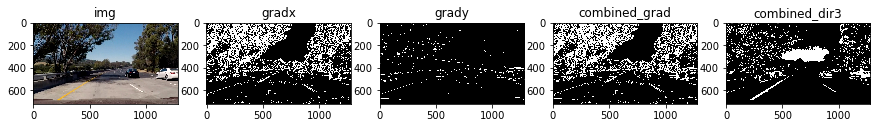

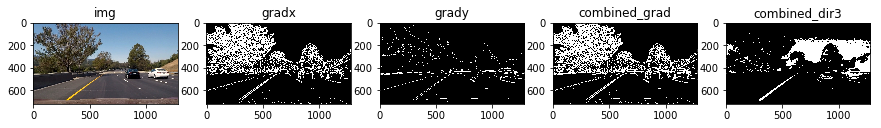

In [68]:
import math

# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Lab
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel = lab[:,:,0]
    b_channel = lab[:,:,2]
    l_thresh = binary_threshold(l_channel, thresh=(210,255))
    b_thresh = binary_threshold(b_channel, thresh=(148,255))
    
    #HLS
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    r_channel = img[:,:,0]
    s_threshold = binary_threshold(s_channel, thresh=(205,255))
    r_threshold = binary_threshold(r_channel, thresh=(205,255))
    
    # Comine all
    combined_binary = np.zeros_like(l_thresh)
    combined_binary[ (l_thresh == 1) | (b_thresh == 1) | (s_threshold == 1) | (r_threshold == 1) ] = 1
    
    gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=7, thresh=(10, 255))
    grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=7, thresh=(60, 255))
    
    combined_grad = np.zeros_like(gradx)
    combined_grad[ (gradx == 1) | (grady == 1) ] = 1
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(gradx, cmap='gray')
    ax2.set_title('gradx')
    ax3.imshow(grady, cmap='gray')
    ax3.set_title('grady')
    ax4.imshow(combined_grad, cmap='gray')
    ax4.set_title('combined_grad')
    ax5.imshow(combined_binary, cmap='gray')
    ax5.set_title('combined_dir3')
   

## Lets play around with Direction Threshold



Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


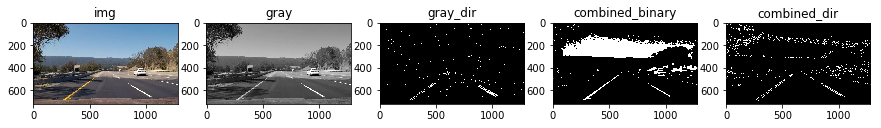

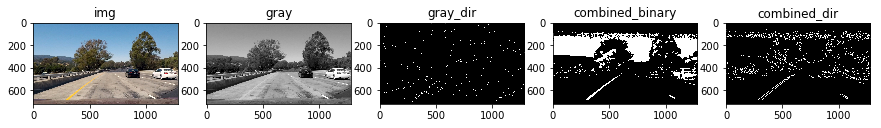

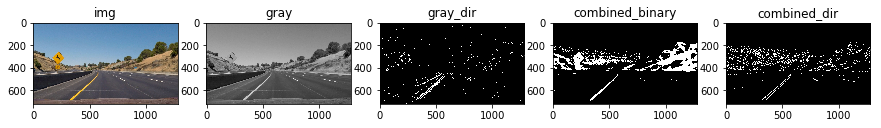

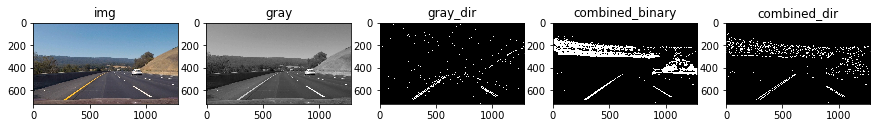

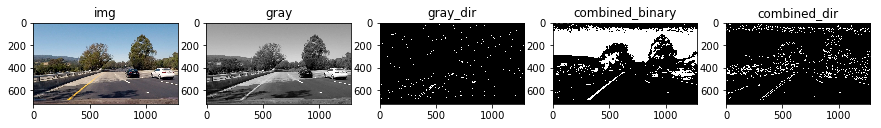

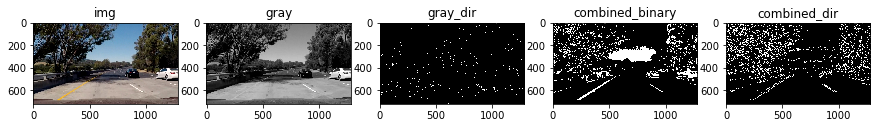

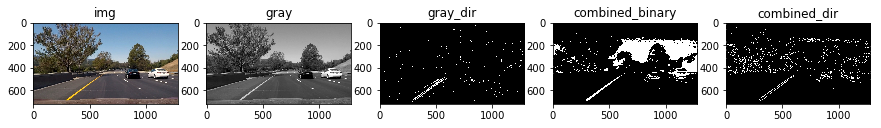

In [69]:
# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Lab
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel = lab[:,:,0]
    b_channel = lab[:,:,2]
    l_thresh = binary_threshold(l_channel, thresh=(210,255))
    b_thresh = binary_threshold(b_channel, thresh=(148,255))
    
    #HLS
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    r_channel = img[:,:,0]
    s_threshold = binary_threshold(s_channel, thresh=(205,255))
    r_threshold = binary_threshold(r_channel, thresh=(205,255))
    
    # Comine all
    combined_binary = np.zeros_like(l_thresh)
    combined_binary[ (l_thresh == 1) | (b_thresh == 1) | (s_threshold == 1) | (r_threshold == 1) ] = 1
    
    
    gray_dir = dir_threshold(gray, sobel_kernel=21, thresh=(0.60, 1.25))
    kernel = np.ones((5,5),np.uint8)
    gray_dir = erode(gray_dir,kernel,iterations = 1)
    #gray_dir = gaussian_blur(gray_dir, kernel_size=3)
    combined_dir = dir_threshold(combined_binary, sobel_kernel=5, thresh=(0.7, 1.3))
    
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(gray, cmap='gray')
    ax2.set_title('gray')
    ax3.imshow(gray_dir, cmap='gray')
    ax3.set_title('gray_dir')
    ax4.imshow(combined_binary, cmap='gray')
    ax4.set_title('combined_binary')
    ax5.imshow(combined_dir, cmap='gray')
    ax5.set_title('combined_dir')
   

## Lets find best magnitude for s channel

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


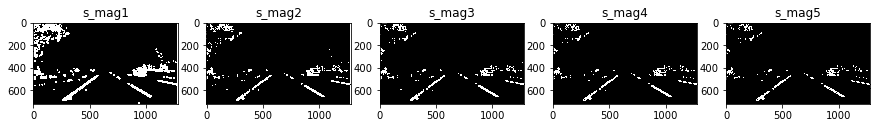

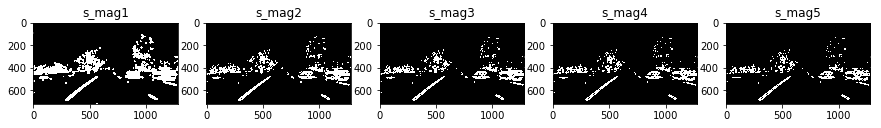

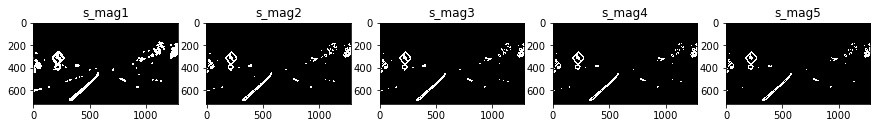

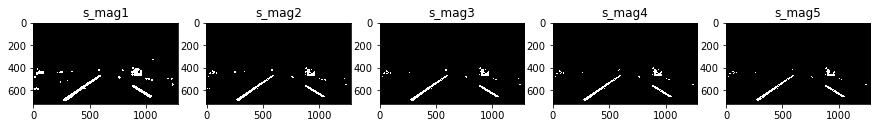

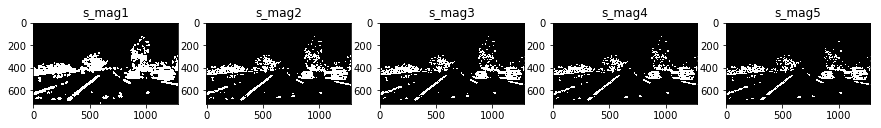

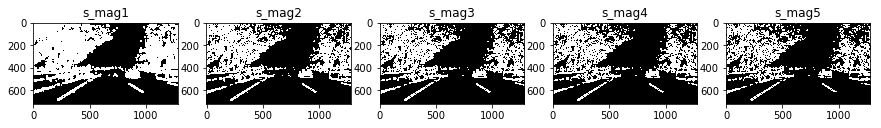

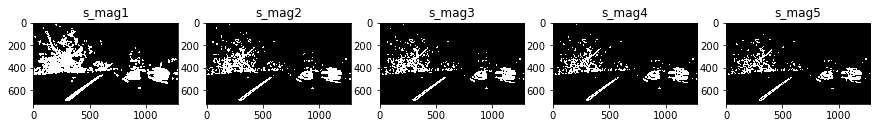

In [70]:

# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    r_channel = img[:,:,0]
    
    gray_thresh = binary_threshold(gray, thresh=(205,255))
    l_threshold = binary_threshold(l_channel, thresh=(205,255))
    s_threshold = binary_threshold(s_channel, thresh=(180,255))
    r_threshold = binary_threshold(r_channel, thresh=(205,255))
    
    s_mag1 = mag_thresh(s_threshold, sobel_kernel=31, thresh=(1, 255))
    s_mag2 = mag_thresh(s_threshold, sobel_kernel=31, thresh=(15, 255))
    s_mag3 = mag_thresh(s_threshold, sobel_kernel=31, thresh=(20, 255))
    s_mag4 = mag_thresh(s_threshold, sobel_kernel=31, thresh=(25, 255))
    s_mag5 = mag_thresh(s_threshold, sobel_kernel=31, thresh=(30, 255))
    
    #color_binary = np.dstack((l_pipe, s_pipe, r_pipe))
    #combined_binary = np.zeros_like(s_pipe)
    #combined_binary[(s_pipe == 1) | (l_pipe == 1) | (r_binary == 1) ] = 1

       
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,15))
    ax1.imshow(s_mag1, cmap='gray')
    ax1.set_title('s_mag1')
    ax2.imshow(s_mag2, cmap="gray")
    ax2.set_title('s_mag2')
    ax3.imshow(s_mag3, cmap="gray")
    ax3.set_title('s_mag3')
    ax4.imshow(s_mag4, cmap="gray")
    ax4.set_title('s_mag4')
    ax5.imshow(s_mag5, cmap="gray")
    ax5.set_title('s_mag5')

## Threshold Testing for any channel


Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


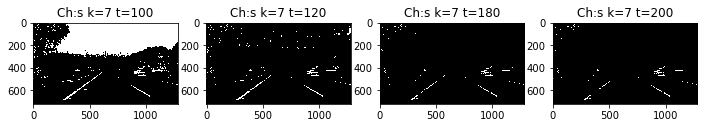

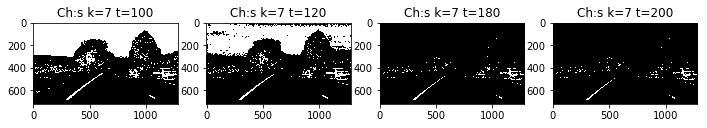

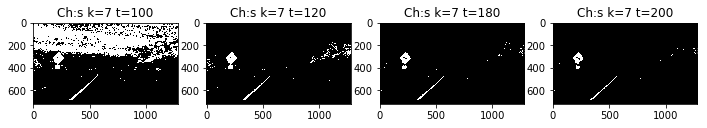

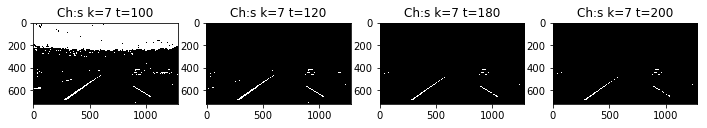

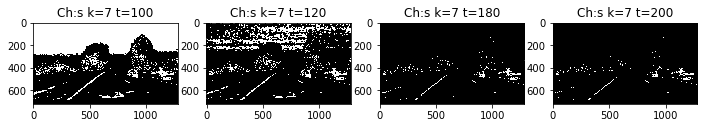

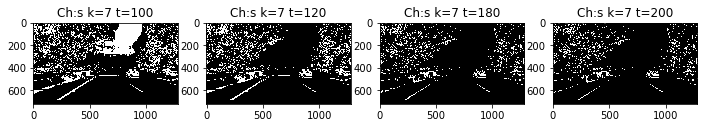

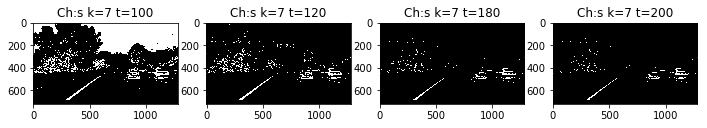

In [71]:
def thresh_compare(images, channel, channel_thresh, sob_kernel_list):
    # Step through the list and search for chessboard corners
    plt.figure(1, figsize=(10,6))
    plt_size = math.ceil( math.sqrt( float(len(images)) ) )
    
    
    for idx, fname in enumerate(images):
        print("Image: ", fname)
        img = cv2.imread(fname)
        
        if channel == 'gray':
            img_channel = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        if channel == 'r':
            img_channel = img[:,:,0]
        if channel == 'g':
            img_channel = img[:,:,1]
        if channel == 'b':
            img_channel = img[:,:,2]
        if channel == 'h' :
            hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
            img_channel = hls[:,:,0]
        if channel == 'l':
            hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
            img_channel = hls[:,:,1]
        if channel == 's':
            hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
            img_channel = hls[:,:,2]
    
        fig = plt.figure(figsize=(15,15))
        for img_idx in range(4):
            img_threshold = binary_threshold(img_channel, thresh=(channel_thresh[img_idx],255))

            ax = fig.add_subplot(1, 5, img_idx+1)
            ax.imshow(img_threshold, cmap='gray')
            ax.set_title('Ch:'+channel+' k='+str(sob_kernel_list[img_idx])+" t="+str(channel_thresh[img_idx]))
    plt.savefig('output_images/'+channel+'_thresholds.png')
        
images = glob.glob('test_images/test*.jpg')
channel_thresh=[100, 120, 180, 200, 220]
sob_kernel=[7,7,7,7,7]
thresh_compare(images, 's', channel_thresh, sob_kernel)



## Lets put together the best pipelines from above

Image:  test_images\test0.jpg
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


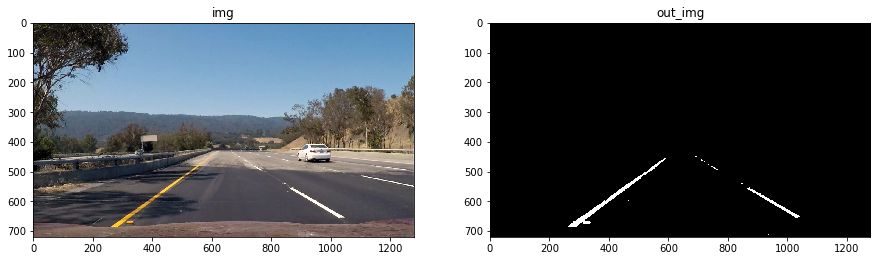

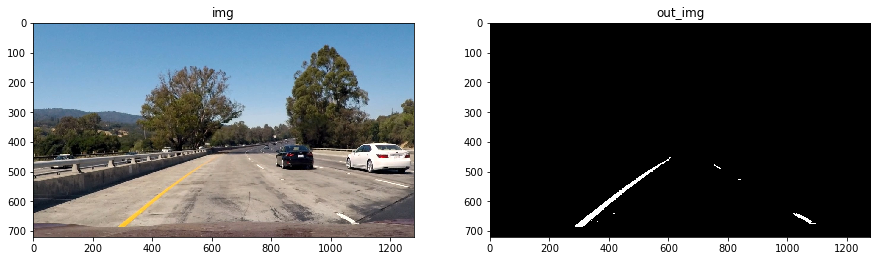

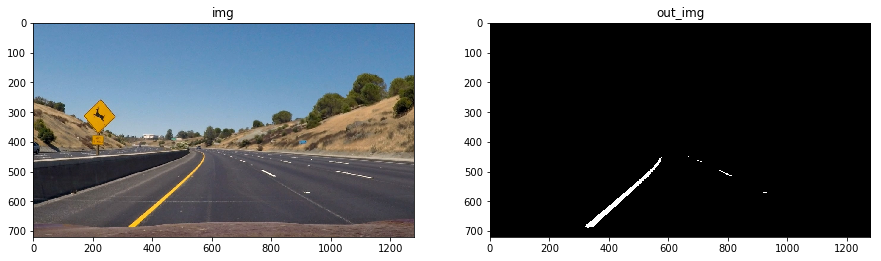

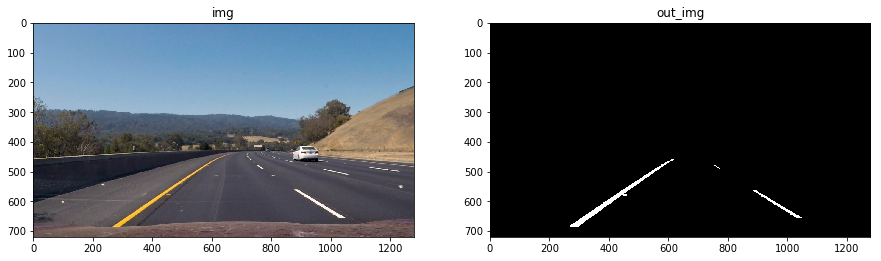

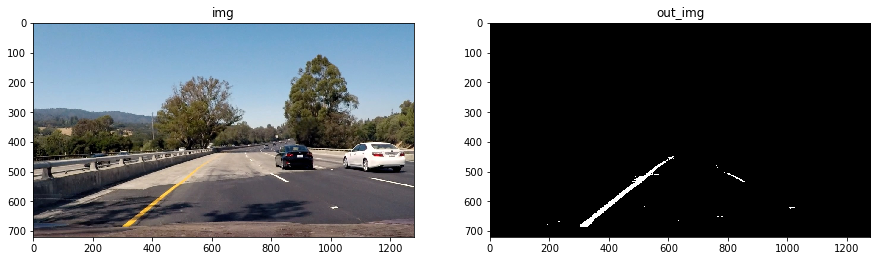

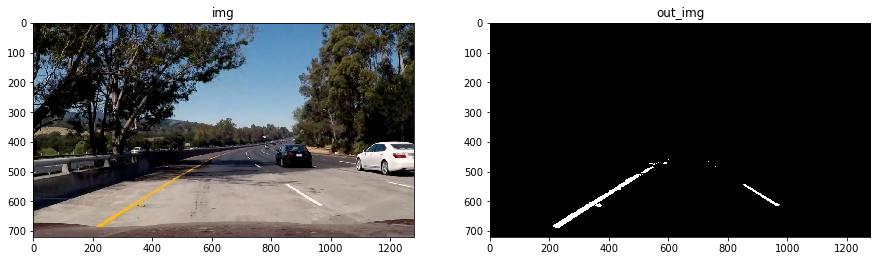

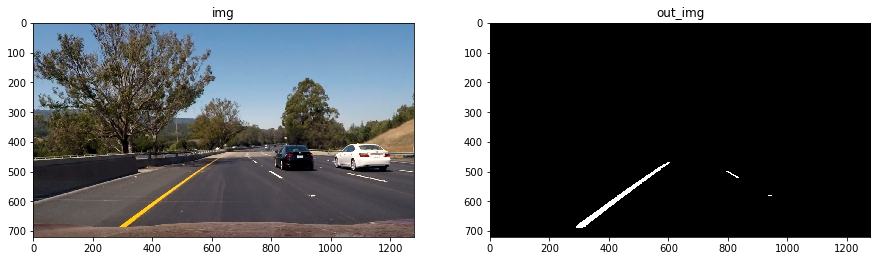

In [72]:
import math


# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    img = cv2.imread(fname)
    
    out_img = preprocess(img,
                    s_threshold=(205,255),
                    r_threshold=(205,255),
                    l_threshold=(210,255),
                    b_threshold=(148,255),)
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f,(ax1,ax2) = plt.subplots(1,2,figsize=(15,15))
    ax1.imshow(img)
    ax1.set_title('img')
    ax2.imshow(out_img, cmap='gray')
    ax2.set_title('out_img')


### Test methods for image processing

## Method to get birds eye view
Here we want to open up an example image of a flat road with straight lane lines. We use the straight lane lines to create determine the perspective transform, knowing that the lines are straight and parallel.

First we need a callback event to get position of mouse clicks on plots.
We then need a plot of the image which will let us select four points / corners on the lane lines.
Each click draws a horizontal line on the image to assist with the point on the opposite lane


In [73]:
%matplotlib notebook
from matplotlib.widgets import Button
import matplotlib.pyplot as plt
        

def get_pt(event, x, y, flags, param):
    # grab references to the global variables
    global corners, new_pt

    # if the left mouse button was clicked, add (x, y) to coordinate list
    if event == cv2.EVENT_LBUTTONUP:
        corners.append((x, y))
        new_pt = True;

def select_lane_corners(image):
    global new_pt, corners
    new_pt = False
    corners = []
    
    # load the image and setup the mouse callback function
    clone = image.copy()
    cv2.namedWindow("image")
    cv2.setMouseCallback("image", get_pt)

    # keep looping until the 4 coords received
    # r to reset
    # c to cancel
    cv2.imshow("image", clone)
    while len(corners)<4:

        # display the image and wait for a keypress

        key = cv2.waitKey(1) & 0xFF

        # if the 'r' key is pressed, reset the cropping region
        if key == ord("r"):
            clone = image.copy()
            corners = []
        # if the 'c' key is pressed, break from the loop
        elif key == ord("c"):
            break

        if new_pt == True:
            cv2.line(clone, (0,corners[len(corners)-1][1]), (image.shape[1],corners[len(corners)-1][1]), (0,0, 255), 1)
            new_pt = False

        cv2.imshow("image", clone)

    # close all open windows
    cv2.destroyAllWindows()
    

### Order the lane line points
It turns out the OpenCV method to get Perspective Transform requires the points to be selected in a particular clockwise order. In case this has not been done, we can order the points. This method has been sourced from   http://www.pyimagesearch.com/2016/03/21/ordering-coordinates-clockwise-with-python-and-opencv/

In [74]:
# http://www.pyimagesearch.com/2016/03/21/ordering-coordinates-clockwise-with-python-and-opencv/
from scipy.spatial import distance
 
def order_points(pts):
    # sort the points based on their x-coordinates
    xSorted = pts[np.argsort(pts[:, 0]), :]

    # grab the left-most and right-most points from the sorted
    # x-roodinate points
    leftMost = xSorted[:2, :]
    rightMost = xSorted[2:, :]

    # now, sort the left-most coordinates according to their
    # y-coordinates so we can grab the top-left and bottom-left
    # points, respectively
    leftMost = leftMost[np.argsort(leftMost[:, 1]), :]
    (tl, bl) = leftMost

    # now that we have the top-left coordinate, use it as an
    # anchor to calculate the Euclidean distance between the
    # top-left and right-most points; by the Pythagorean
    # theorem, the point with the largest distance will be
    # our bottom-right point
    D = distance.cdist(tl[np.newaxis], rightMost, "euclidean")[0]
    (br, tr) = rightMost[np.argsort(D)[::-1], :]

    # return the coordinates in top-left, top-right,
    # bottom-right, and bottom-left order
    return np.array([tl, tr, br, bl], dtype="float32")


## Method to unwrap lane
First we take the selected lane corners and calculate the perspective transform matrix using arbitrary desitination points. The unwraped image with straight lanes is returned along with the transformation matrix.


In [75]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, corners, cameraMatrix=mtx, distCoeffs=dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = remove_distortion(img, cameraMatrix, distCoeffs)

    offset = 350 # offset for dst points
    
    # Grab the image shape
    img_size = (undist.shape[1], undist.shape[0])

    # For source points I'm grabbing the outer four detected corners
    src = np.float32(
                        [corners[0], ## BL
                         corners[1], ## TL
                         corners[2], ## BR
                         corners[3]  ## TR
                    ]) 
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([[offset, 0], ## Top Left
                      [img_size[0]-offset, 0], ## Top Right
                      [img_size[0]-offset, img_size[1]], ## Botom Right
                      [offset, img_size[1]] ## Bottom Left
                     ])
    print(src)
    print(dst)    
        
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)
    
    warped = lane_mask(warped, [np.array(dst, np.int32).reshape((-1,1,2))])
    # Return the resulting image and matrix
    return warped, M, Minv

### Method to create a mask on the lane given four lane corners

In [76]:
def lane_mask(img, pts):
    #define a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel colour to fill the mask with depending on the input image
    if len(img.shape) == 3: 
        ignore_mask_colour = (0,255,0)
    else:
        ignore_mask_colour = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill colour    
    cv2.fillPoly(mask, pts, ignore_mask_colour)
    
    #returning the image only where mask pixels are nonzero
    #masked_image = cv2.bitwise_and(img, mask)
    return cv2.addWeighted(img,1.0,mask,0.2,0)

### Test birds eye view

Corners points placed in order:
[[  568.   465.]
 [  716.   466.]
 [ 1075.   690.]
 [  237.   690.]]
[[  568.   465.]
 [  716.   466.]
 [ 1075.   690.]
 [  237.   690.]]
[[ 350.    0.]
 [ 930.    0.]
 [ 930.  720.]
 [ 350.  720.]]


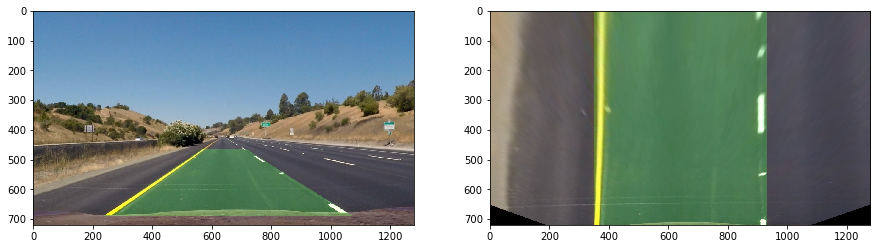

In [83]:
%matplotlib inline

image = cv2.imread('test_images/straight_lines1.jpg')
select_lane_corners(image)  
ordered_coords = order_points(np.array(corners))
print("Corners points placed in order:")
print(ordered_coords)
image = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)
warped, M, Minv = corners_unwarp(image, ordered_coords)
lane_img = lane_mask(image, [np.array(ordered_coords, np.int32).reshape((-1,1,2))])
f,(a1,a2) = plt.subplots(1,2,figsize=(15,15))
a1.imshow(lane_img)
a2.imshow(warped)

## Lets try another image

Corners points placed in order:
[[  571.   464.]
 [  718.   464.]
 [ 1069.   684.]
 [  259.   683.]]
[[  571.   464.]
 [  718.   464.]
 [ 1069.   684.]
 [  259.   683.]]
[[ 350.    0.]
 [ 930.    0.]
 [ 930.  720.]
 [ 350.  720.]]


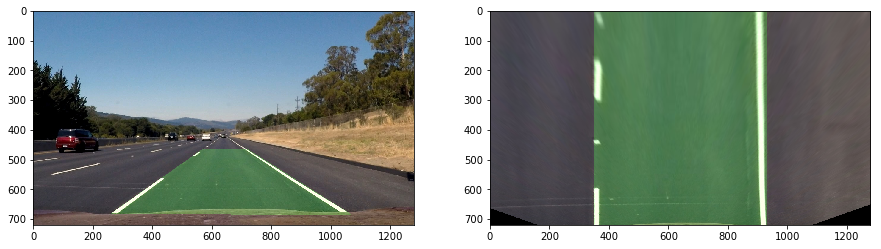

In [84]:
%matplotlib inline

image = cv2.imread('test_images/straight_lines2.jpg')
select_lane_corners(image)  
ordered_coords = order_points(np.array(corners))
print("Corners points placed in order:")
print(ordered_coords)
image = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)
warped2, M2, Minv = corners_unwarp(image, ordered_coords)
lane_img2 = lane_mask(image, [np.array(ordered_coords, np.int32).reshape((-1,1,2))])
f,(a1,a2) = plt.subplots(1,2,figsize=(15,15))
a1.imshow(lane_img2)
a2.imshow(warped2)

In [85]:
print("Difference:")
print(np.around(M-M2))
Mav = (M+M2)/2
print(Mav)
print(Minv)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
with open("camera_cal/perspective_cal.p", "wb" ) as f:
    pickle.dump(Mav, f)
    pickle.dump(Minv, f)

print("Pickled File: ",f)

Difference:
[[ 0. -0. -4.]
 [ 0. -0. -4.]
 [ 0. -0.  0.]]
[[ -4.53742727e-01  -1.50751423e+00   9.17703582e+02]
 [  7.16639517e-03  -2.11920213e+00   9.80299901e+02]
 [  9.62384607e-06  -2.41655204e-03   1.00000000e+00]]
[[  2.52299231e-01  -7.27281042e-01   4.82410610e+02]
 [ -6.60905449e-04  -4.71714052e-01   4.64000000e+02]
 [ -1.42436519e-06  -1.13576732e-03   1.00000000e+00]]
Pickled File:  <_io.BufferedWriter name='camera_cal/perspective_cal.p'>


## Load perspective transform matrix

In [9]:
with open("camera_cal/perspective_cal.p", "rb" ) as f:
    M = pickle.load(f)
    Minv = pickle.load(f)

print("Perspective Transform:")
print(M)
print(Minv)

Perspective Transform:
[[ -4.46180529e-01  -1.50667317e+00   9.13579125e+02]
 [  1.05682043e-02  -2.00052680e+00   8.94994073e+02]
 [  1.49724186e-05  -2.41938344e-03   1.00000000e+00]]
[[  1.67060509e-01  -7.86173551e-01   5.36922280e+02]
 [  4.73762309e-03  -5.14768914e-01   4.47392790e+02]
 [  6.70254013e-06  -1.23103320e-03   1.00000000e+00]]


## Nice, now lets try with curved lanes, using M

Using perspective matrix, M:
[[ -4.46180529e-01  -1.50667317e+00   9.13579125e+02]
 [  1.05682043e-02  -2.00052680e+00   8.94994073e+02]
 [  1.49724186e-05  -2.41938344e-03   1.00000000e+00]]
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


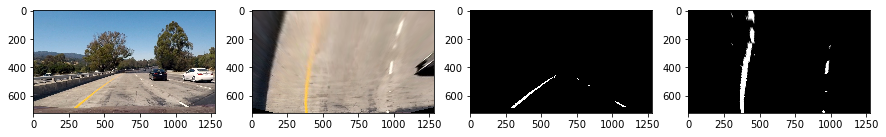

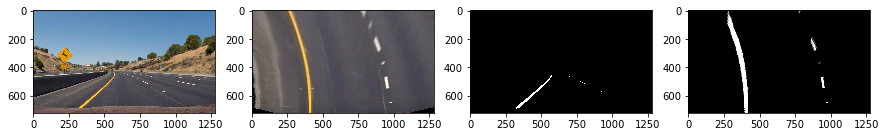

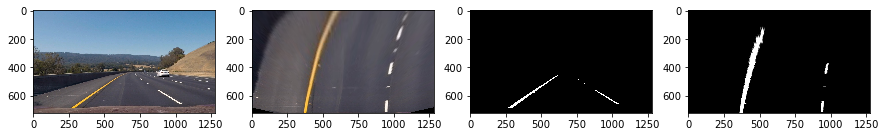

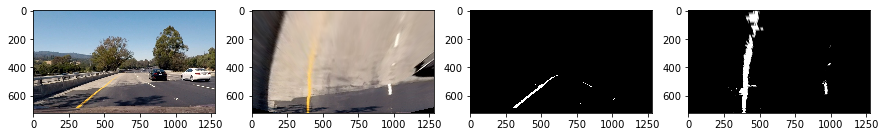

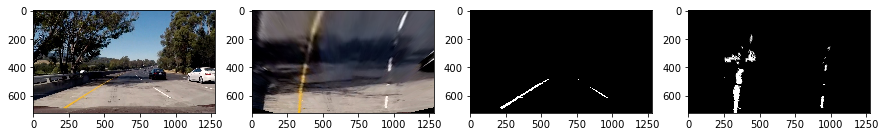

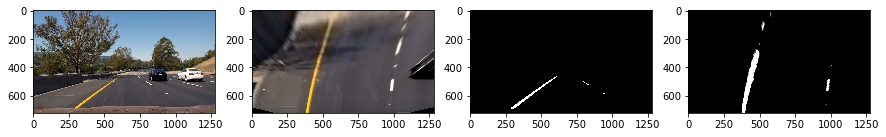

In [10]:
import math
%matplotlib inline

# Make a list of test images
images = glob.glob('test_images/test*.jpg')

print("Using perspective matrix, M:")
print(M)

# Step through the list and process birds eye view
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    image = cv2.imread(fname)
    img_size = (image.shape[1], image.shape[0])

    warped = cv2.warpPerspective(image, M, img_size)

    image_lane = preprocess(image)
    img_size = (image_lane.shape[1], image_lane.shape[0])

    image_lane = np.dstack((image_lane, image_lane, image_lane))*255

    
    
    warped2 = cv2.warpPerspective(image_lane, M, img_size)

    f,(a1,a2,a3,a4) = plt.subplots(1,4,figsize=(15,15))
    image = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)  
    a1.imshow(image)
    warped = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)
    a2.imshow(warped)
    a3.imshow(image_lane, cmap='gray')
    a4.imshow(warped2, cmap='gray')
    
    out_img = np.dstack((warped2, warped2, warped2))*255
    write_name = 'output_images/warped_example_'+str(idx)+'.jpg'
    cv2.imwrite(write_name, warped2)

## And this time using M2

Using perspective matrix, M2:
[[ -4.46180529e-01  -1.50667317e+00   9.13579125e+02]
 [  1.05682043e-02  -2.00052680e+00   8.94994073e+02]
 [  1.49724186e-05  -2.41938344e-03   1.00000000e+00]]
Image:  test_images\test1.jpg
Image:  test_images\test2.jpg
Image:  test_images\test3.jpg
Image:  test_images\test4.jpg
Image:  test_images\test5.jpg
Image:  test_images\test6.jpg


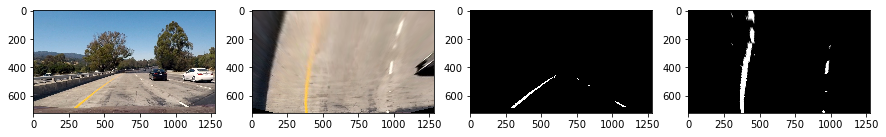

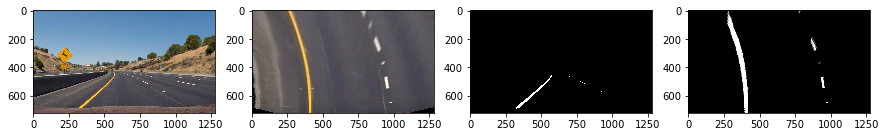

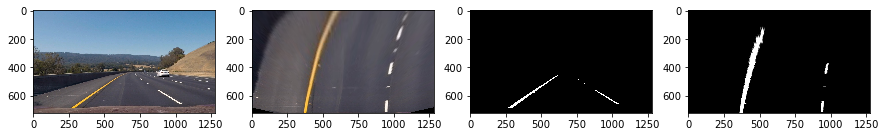

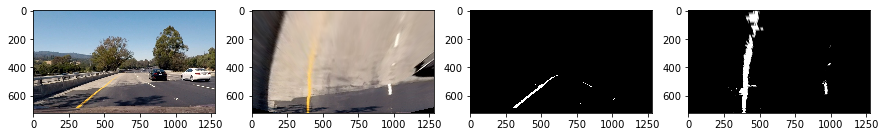

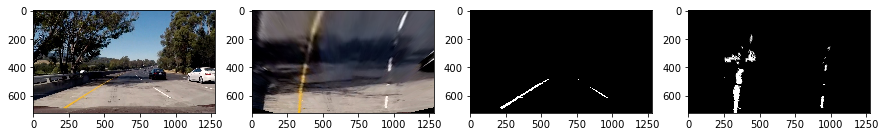

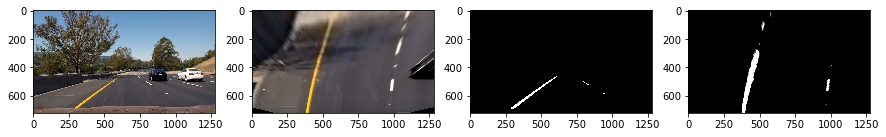

In [11]:

    
import math
%matplotlib inline

# Make a list of test images
images = glob.glob('test_images/test*.jpg')

print("Using perspective matrix, M2:")
print(M)

# Step through the list and process birds eye view
plt.figure(1, figsize=(10,6))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
for idx, fname in enumerate(images):
    print("Image: ", fname)
    image = cv2.imread(fname)
    img_size = (image.shape[1], image.shape[0])

    warped = cv2.warpPerspective(image, M, img_size)

    image_lane = preprocess(image)
    img_size = (image_lane.shape[1], image_lane.shape[0])

    image_lane = np.dstack((image_lane, image_lane, image_lane))*255

    
    
    warped2 = cv2.warpPerspective(image_lane, M, img_size)

    f,(a1,a2,a3,a4) = plt.subplots(1,4,figsize=(15,15))
    image = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)  
    a1.imshow(image)
    warped = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)
    a2.imshow(warped)
    a3.imshow(image_lane, cmap='gray')
    a4.imshow(warped2, cmap='gray')
       
    #out_img = np.dstack((warped2, warped2, warped2))*255
    write_name = 'output_images/warped_example_'+str(idx)+'.jpg'
    cv2.imwrite(write_name, warped2)

## Time to fit some curves to lanes

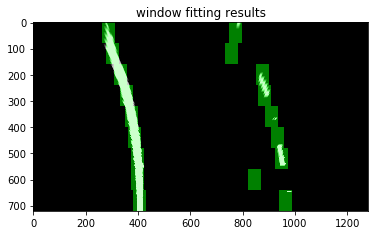

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2

# Read in a thresholded image
warped = mpimg.imread('output_images/warped_example_1.jpg')
warped = warped[:,:,0]
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 120 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 0.8, template, 0.5, 0.0) # overlay the orignal road image with window results

# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()


## Measure the curvature of the line

(720, 1280)


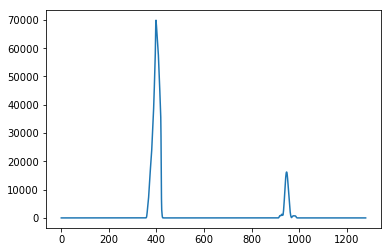

In [18]:
%matplotlib inline

binary_warped = output.copy()[:,:,0]
print(binary_warped.shape)

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

plt.plot(histogram)


In [19]:

# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

print("Midpoint: ", midpoint)
print("Left x base: ", leftx_base)
print("Right x base: ", rightx_base)

Midpoint:  640
Left x base:  398
Right x base:  947


In [22]:
# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 3) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 3) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

## Visualise the results

(720, 0)

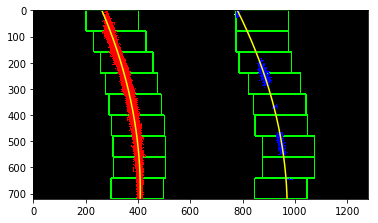

In [23]:
%matplotlib inline

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

### Assume you now have a new warped binary image from the next frame of video (also called "binary_warped"). It's now much easier to find line pixels!

In [24]:
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
left_fit[1]*nonzeroy + left_fit[2] + margin))) 

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

### Now lets visualise the new image with lanes highlighted

(720, 0)

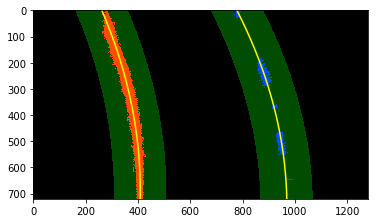

In [25]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## Now lets calculate the curvature

In [26]:
# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)


1611.83012832 1478.15120478


## Convert from pixel curvature to real world curvature

In [28]:
# Define conversions in x and y from pixels space to meters

lane_width_px = rightx_base-leftx_base
print(lane_width_px)
ym_per_pix = 40/720 # meters per pixel in y dimension
xm_per_pix = 3.7/lane_width_px # meters per pixel in x dimension
print(ym_per_pix)
print(xm_per_pix)
print(ploty.shape)
print(leftx.shape)
print(rightx.shape)
# Fit new polynomials to x,y in world space
#left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
#right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)

# Fit a second order polynomial to each
left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

#ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#left_fitx = left_fit_cr[0]*ploty**2 + left_fit_cr[1]*ploty + left_fit_cr[2]
#right_fitx = right_fit_cr[0]*ploty**2 + right_fit_cr[1]*ploty + right_fit_cr[2]

# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

549
0.05555555555555555
0.00673952641166
(720,)
(28611,)
(6370,)
737.73727324 m 676.474229873 m


## Methods to get lanes, polynomials and curvature

In [30]:
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint
ym_per_pix = 40/720 # meters per pixel in y dimension
xm_per_pix = 3.7/(rightx_base-leftx_base) #lane_width_px # meters per pixel in x dimension
centre = (leftx_base + rightx_base)/2
position = (midpoint - centre)*xm_per_pix
print(position)

-0.219034608379


In [60]:

def get_new_lane(raw_image, M, plot_on=True):
    
    img_size = (raw_image.shape[1], raw_image.shape[0])
    image_lane = preprocess(raw_image)
    image_lane = np.dstack((image_lane, image_lane, image_lane))*255
    warped_binary = cv2.warpPerspective(image_lane, M, img_size)
    binary_warped = warped_binary.copy()[:,:,0]
    
    warped_colour = cv2.warpPerspective(raw_image, M, img_size)

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    binary_warped = raw_image.copy()[:,:,0]
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    ym_per_pix = 50/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/(rightx_base-leftx_base) #lane_width_px # meters per pixel in x dimension
    centre = (leftx_base + rightx_base)/2
    position = (midpoint - centre)*xm_per_pix
    
    # Fit a second order polynomial to each
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    curvature = (left_curverad + right_curverad)/2
    
    yvals = ploty
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (raw_image.shape[1], raw_image.shape[0])) 
    # Combine the result with the original image
    result2 = cv2.addWeighted(raw_image, 1, newwarp, 0.3, 0)
    # Put text on an image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result2,text,(100,100), font, 1,(255,255,255),3)
    # Find the position of the car
    pts = np.argwhere(newwarp[:,:,1])
    
    if position < 0:
        text = "Vehicle is {:.2f} m left of centre".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of centre".format(position)
    cv2.putText(result2,text,(100,150), font, 1,(255,255,255),3)
    
    result2 = cv2.cvtColor(result2, cv2.COLOR_BGR2RGB)
    #plt.imshow(result2)
    # Draw the lane onto the warped blank image
    if plot_on == True:
        plt.figure(1, figsize=(15,15))
        #cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        #cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        #result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        #result = cv2.addWeighted(image_lane, 1, result, 0.3, 0)
        #result2 = cv2.cvtColor(result2, cv2.COLOR_BGR2RGB)
        plt.imshow(result2)
        #plt.plot(left_fitx, ploty, color='yellow')
        #plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)

    return result2, left_fit, right_fit
    
    #return left_fit, right_fit

def get_next_lane(raw_image, M, left_fit, right_fit, plot_on=True):
        
    img_size = (raw_image.shape[1], raw_image.shape[0])
    image_lane = preprocess(raw_image)
    image_lane = np.dstack((image_lane, image_lane, image_lane))*255
    warped_binary = cv2.warpPerspective(image_lane, M, img_size)
    binary_warped = warped_binary.copy()[:,:,0]
    
    warped_colour = cv2.warpPerspective(raw_image, M, img_size)
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    
    
    #return left_fitx, right_fitx, ploty
    #lane_width_px = rightx_base-leftx_base
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    ym_per_pix = 50/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/(rightx_base-leftx_base) #lane_width_px # meters per pixel in x dimension
    centre = (leftx_base + rightx_base)/2
    position = (midpoint - centre)*xm_per_pix
    
    # Fit a second order polynomial to each
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    curvature = (left_curverad + right_curverad)/2
    
    yvals = ploty
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (raw_image.shape[1], raw_image.shape[0])) 
    # Combine the result with the original image
    result2 = cv2.addWeighted(raw_image, 1, newwarp, 0.3, 0)
    # Put text on an image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result2,text,(100,100), font, 1,(255,255,255),3)
    # Find the position of the car
    pts = np.argwhere(newwarp[:,:,1])
    
    if position < 0:
        text = "Vehicle is {:.2f} m left of centre".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of centre".format(position)
    cv2.putText(result2,text,(100,150), font, 1,(255,255,255),3)
    
    result2 = cv2.cvtColor(result2, cv2.COLOR_BGR2RGB)
    #plt.imshow(result2)
    # Draw the lane onto the warped blank image
    if plot_on == True:
        plt.figure(1, figsize=(15,15))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        result = cv2.addWeighted(image_lane, 1, result, 0.3, 0)
        plt.imshow(result2)
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    return result2, left_fit, right_fit
    

## Test the pipeline for lanes

6
3
Image:  test_images\test1.jpg
No left or right fit detected
Left Fit:  [ -4.54851287e-05  -8.89601973e-02   4.51725019e+02]
Right Fit:  [  1.15002958e-04  -2.10154027e-01   1.04468267e+03]


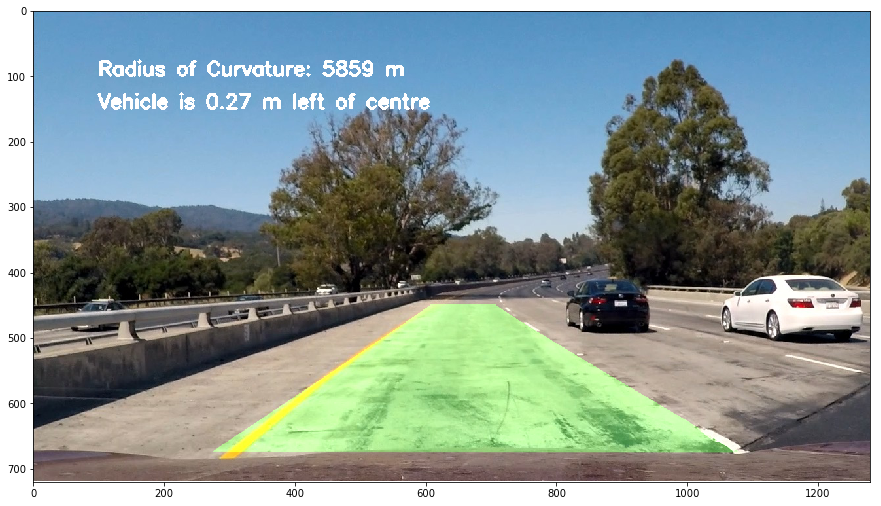

Image:  test_images\test2.jpg
Left and right fit detected


C:\Users\Peter\Anaconda3\envs\tensorflow-gpu35\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: elementwise == comparison failed; this will raise an error in the future.


Left Fit:  [ -2.69843870e-04   3.79578556e-01   2.75478268e+02]
Right Fit:  [  8.50178668e-06   1.85056904e-01   8.51978199e+02]


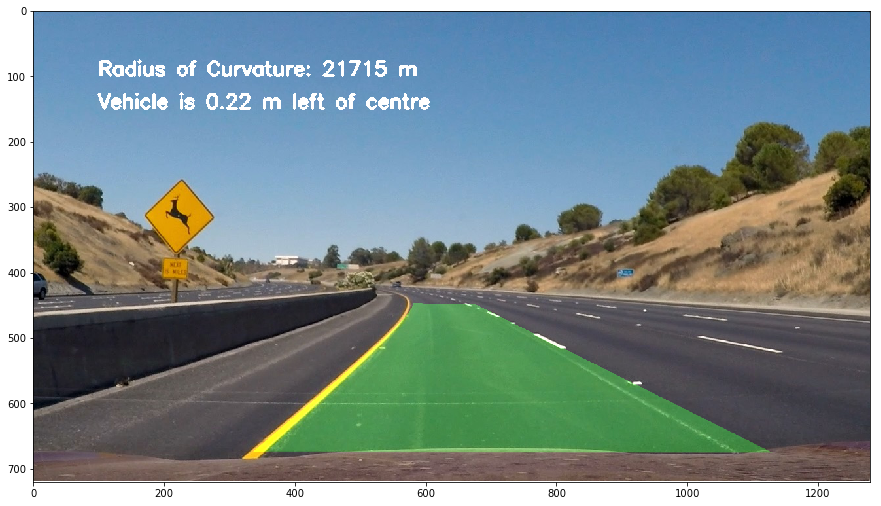

Image:  test_images\test3.jpg
Left and right fit detected
Left Fit:  [ -6.31656333e-05  -1.48932093e-01   5.08725071e+02]
Right Fit:  [  2.75709433e-04  -4.12757029e-01   1.09736151e+03]


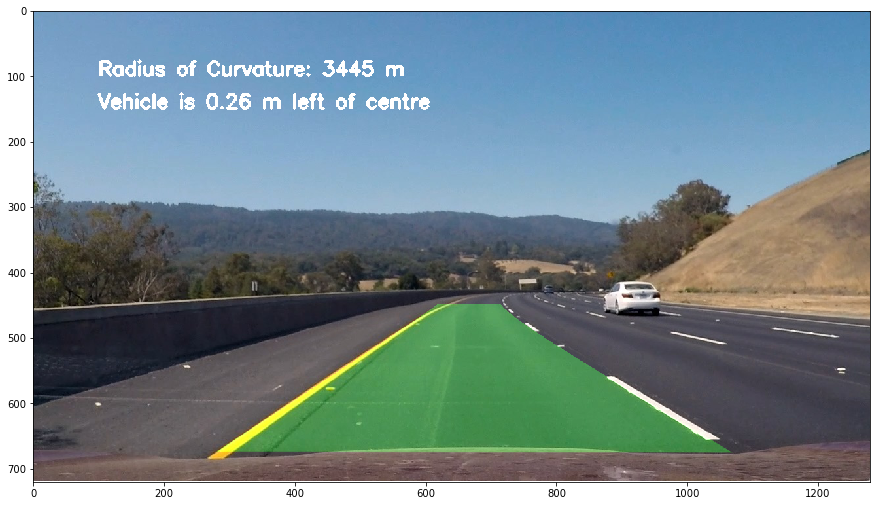

Image:  test_images\test4.jpg
Left and right fit detected
Left Fit:  [  7.19026860e-05  -1.75083219e-01   4.74994944e+02]
Right Fit:  [  3.90983379e-04  -4.51814103e-01   1.09808009e+03]


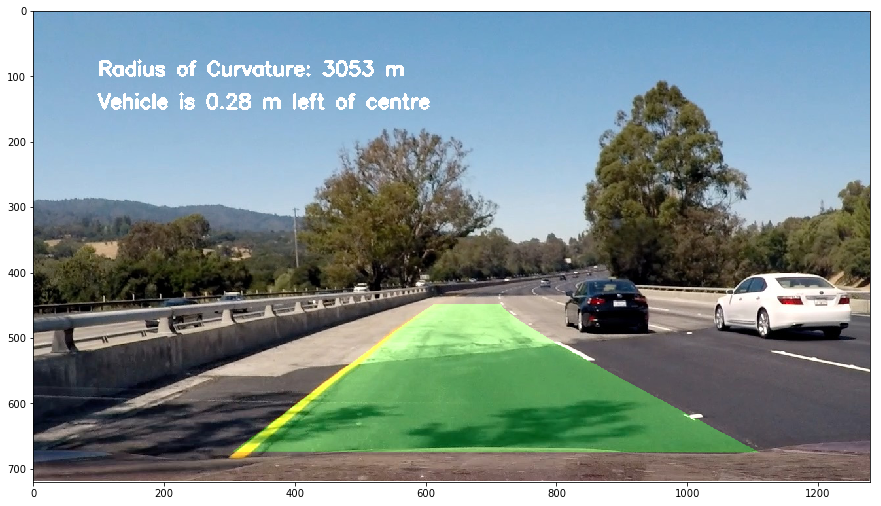

Image:  test_images\test5.jpg
Left and right fit detected
Left Fit:  [  3.87207001e-04  -5.90480295e-01   5.55475761e+02]
Right Fit:  [  1.73567595e-04  -2.78639120e-01   1.05076672e+03]


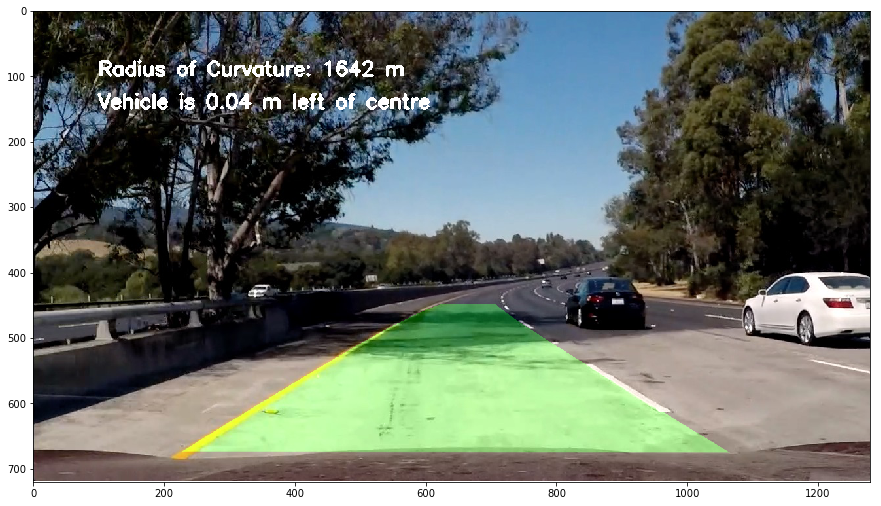

Image:  test_images\test6.jpg
Left and right fit detected
Left Fit:  [  9.43317325e-05  -3.26440170e-01   5.71387677e+02]
Right Fit:  [  2.88740267e-04  -4.36086327e-01   1.13371507e+03]


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [61]:
%matplotlib inline
import math

left_fit = []
right_fit = []

# Make a list of test images
images = glob.glob('test_images/test*.jpg')
print(len(images))
# Step through the list and process curvature for each example
#plt.figure(1, figsize=(15,12))
plt_size = math.ceil( math.sqrt( float(len(images)) ) )
print(plt_size)
for idx, fname in enumerate(images):
    print("Image: ", fname)
    raw_image = cv2.imread(fname)
    
    #result, left_fit, right_fit = get_next_lane(raw_image, M2, left_fit, right_fit) #
    #process_image(raw_image)
    #result, left_fit, right_fit = get_new_lane(raw_image, M2)
    
    if (left_fit == []) | (right_fit == []):
        print("No left or right fit detected")
        result, left_fit, right_fit = get_new_lane(raw_image, M)
    else:
        print("Left and right fit detected")
        result, left_fit, right_fit = get_next_lane(raw_image, M, left_fit, right_fit)
    
    print("Left Fit: ", left_fit)
    print("Right Fit: ", right_fit)
    
    #cv2.waitKey(500)
    
    plt.show()
    
    #plt.imshow(result)


    

## Lets create a video pipeline

### Lane tracking class 

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        

In [ ]:
Left = Line()
Right = Line()

def process_video(raw_image):
    global Left, Right
    
    undst_img = remove_distortion(raw_image, cameraMatrix=mtx, distCoeffs=dist)
    
    #if (Left.detected == False) | (Right.detected == False):
    #result, left_fit, right_fit = get_new_lane(raw_image, M2, plot_on=False)
    #result, left_fit, right_fit = get_new_lane(image, M2)
    #    Left.detected = True
    #    Right.detected = True
    #else:
    if (Left.detected == False) | (Right.detected == False):
        #print("No left or right fit detected")
        result, Left.current_fit, Right.current_fit = get_new_lane(undst_img, M, plot_on=False)
        Left.detected = True
        Right.detected = True
    else:
        #print("Left and right fit detected")
        result, Left.current_fit, Right.current_fit = get_next_lane(undst_img, M, Left.current_fit, Right.current_fit, plot_on=False)
    
    result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    return result 

#resultnew = process_video(image) 
#resultnew = cv2.cvtColor(resultnew, cv2.COLOR_BGR2RGB)
#plt.imshow(resultnew)    

In [ ]:
import imageio
imageio.plugins.ffmpeg.download() # you may need to install, try run this

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:


video_output = 'project_result.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip = VideoFileClip('project_video.mp4').subclip(1,5)
#my_sub_clip = clip.subclip(1,5) 
##PLOT_ON = 0
#clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
video_clip = clip.fl_image(process_video)
%time video_clip.write_videofile(video_output, audio=False)
   
    
clip.reader.close()
video_clip.reader.close()
video_clip.audio.reader.close_proc()

In [ ]:
Left = Line()
Right = Line()

left_fit = []
right_fit = []

video_output = 'project_result.mp4'

clip = VideoFileClip('challenge_video.mp4').subclip(1,5) # can be gif or movie
for frame in clip.iter_frames():
    # now frame is a numpy array, do wathever you want
    video_clip = process_video(frame)
    # etc.
%time video_clip.write_videofile(video_output, audio=False)

video_clip.reader.close()
video_clip.audio.reader.close_proc()

In [ ]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_result.mp4'))

In [ ]:
video_clip.reader.close()
video_clip.audio.reader.close_proc()